## Notebook used to make synthetic disease progressions for healthy, LIR & MIR subgroups

In [ ]:
# load packages and files
using DifferentialEquations, SciMLBase, Plots, Random # for solving ODEs
using DataFrames
using DataStructures # for the OrderedDict
using LatinHypercubeSampling # for the LHS
using Trapz # for the trapezoidal rule
using CSV # for reading in the parameter distributions of the Ohashi
using Statistics # for the mean and std functions
using JLD2 # for saving the results
rng_test =  Random.seed!(1234) # testing
rng_training = Random.seed!(2) # training
# save_boolean = true # for saving the results


include("../EDES/including.jl") # for the EDES model 
include("../DataGeneration/AnalyseSynths/SyntheticPatients.jl") # for generating initial states of the synthetic patients
include("../DataGeneration/AnalyseSynths/LocalSensitivity.jl") # for the local sensitivity analysis
include("MIRLIR_progression testing.jl") # for the MIRLIR disease trajectories
include("../DataGeneration/AnalyseSynths/Realism_inital.jl") # for the analysis of the synthetic patients


ensure_realism_initial (generic function with 3 methods)

In [128]:
# hyperparameters for the data generation
N_training = 50 # number of training patients
N_test = 10 # number of test patients
BW = 70 
spread_percentage = 0.15

# initial parameters for the synthetic population
distributions_ohashi = CSV.read("./accepted_df_allOHASHI.csv", DataFrame)
# initial_k1 = mean(distributions_ohashi[!, "k1"])
initial_k1 = 0.0075
initial_k5 = mean(distributions_ohashi[!, "k5"])
initial_k6 = mean(distributions_ohashi[!, "k6"])

# initial parameters for the synthetic population
parameter_names = ["k1","k5", "k6"]
initial_people = [initial_k1, initial_k5, initial_k6]
fasting_range_glucose = (4.8, 5.2)
fasting_range_insulin = (7.5, 12.0)

# standard deviations for the parameters, right now
lower_deviations_initial = initial_people .- (initial_people .* spread_percentage )
upper_deviations_initial = initial_people .+ (initial_people .* spread_percentage )


parameter_ranges_initial= OrderedDict( "k1" => (lower_deviations_initial[1], upper_deviations_initial[1]),
                                    "k5" => (lower_deviations_initial[2], upper_deviations_initial[2]),
                                    "k6" => (lower_deviations_initial[3], upper_deviations_initial[3]),
                                   )
fasting_ranges = OrderedDict("fasting_glucose" => fasting_range_glucose, "fasting_insulin" => fasting_range_insulin)


Synthetic_population_training = MakePatients(N_training, parameter_names, parameter_ranges_initial, fasting_ranges, BW = BW, rng= rng_training);
Synthetic_population_test = MakePatients(N_test, parameter_names, parameter_ranges_initial, fasting_ranges, BW = BW, rng= rng_test);

In [129]:
initial_k5

0.11264702331542097

Note here that the starting values of some parameters change in the progressions, so these are with low k3,k4 etc. so are gonna be different from the first measurement in the progression

### Generate individuals progression

In [ ]:
training_data = Synthetic_population_training
test_data = Synthetic_population_test

# Set hyperparameters for the MIR LIR progression
long_time_points = [0,6,12,18,24,30]
lambda_k5 = 0.1 # 1.5 % decrease in k5 per month
fasting_glucose_linear_rate = 0.005 # 1% increase in fasting glucose per month
fasting_insulin_linear_rate = 0.005 # 1% increase in fasting insulin per month
noise_level = 0.01 # 10% noise in the value of the parameters

# Initialise the progression lists
training_progressions = []
test_progressions = []

# Mapping indices to progression functions

# Process training data
for (i, patient) in enumerate(training_data)

    k3s_patient, k4s_patient, k5s_patient,G_liv_b_patient, fasting_glucose, fasting_insulin = MIR_progression(
    patient, long_time_points, lambda_k5, fasting_glucose_linear_rate, fasting_insulin_linear_rate, noise_level)

    
    
    param_names = ["k1", "k3", "k4", "k5", "k6", "G_liv_b"]
    k1s = fill(patient.ParameterValues[1], length(long_time_points))
    k6s = fill(patient.ParameterValues[3], length(long_time_points))
    
    param_values = permutedims(hcat(k1s, k3s_patient, k4s_patient, k5s_patient, k6s, G_liv_b_patient))
    synthetic_progression = SyntheticProgression(patient, long_time_points, param_names, param_values, fasting_glucose, fasting_insulin)
    push!(training_progressions, synthetic_progression)
end

# Save the training progressions
if save_boolean
    JLD2.@save "./Metadata/Training_progressions_healthy.jld2" training_progressions
end

# Process test data
for (i, patient) in enumerate(test_data)
    
    k3s_patient, k4s_patient, k5s_patient,G_liv_b_patient, fasting_glucose, fasting_insulin = MIR_progression(
    patient, long_time_points,  lambda_k5, G_liv_b_linear_rate, fasting_glucose_linear_rate, fasting_insulin_linear_rate, noise_level)

    
    
    param_names = ["k1", "k3", "k4", "k5", "k6", "G_liv_b"]
    k1s = fill(patient.ParameterValues[1], length(long_time_points))
    k6s = fill(patient.ParameterValues[3], length(long_time_points))
    
    param_values = permutedims(hcat(k1s, k3s_patient, k4s_patient, k5s_patient, k6s, G_liv_b_patient))
    synthetic_progression = SyntheticProgression(patient, long_time_points, param_names, param_values, fasting_glucose, fasting_insulin)
    push!(test_progressions, synthetic_progression)
end

# Save the test progressions
if save_boolean
    JLD2.@save "./Metadata/Test_progressions_healthy.jld2" test_progressions
end


### visualise some responses


┌ Warning: Mutation of ODEProblem detected. SciMLBase v2.0 has made ODEProblem temporarily mutable in order to allow for interfacing with EnzymeRules due to a current limitation in the rule system. This change is only intended to be temporary and ODEProblem will return to being a struct in a later non-breaking release. Do not rely on this behavior, use with caution.
└ @ SciMLBase C:\Users\20192809\.julia\packages\SciMLBase\Dwomw\src\problems\ode_problems.jl:168
┌ Warning: Mutation of ODEProblem detected. SciMLBase v2.0 has made ODEProblem temporarily mutable in order to allow for interfacing with EnzymeRules due to a current limitation in the rule system. This change is only intended to be temporary and ODEProblem will return to being a struct in a later non-breaking release. Do not rely on this behavior, use with caution.
└ @ SciMLBase C:\Users\20192809\.julia\packages\SciMLBase\Dwomw\src\problems\ode_problems.jl:168
┌ Warning: Mutation of ODEProblem detected. SciMLBase v2.0 has made 

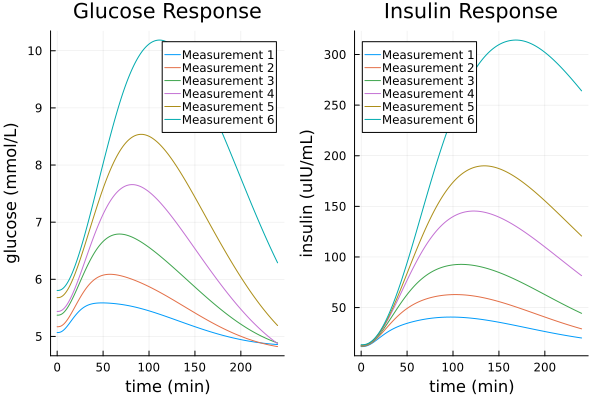

In [139]:
# load the training progressions
# training_progressions = JLD2.load("Metadata/Training_progressions.jld2")["training_progressions"];
# select the first progression
progression =  training_progressions[3]
model = progression.patient.EDES

# plot the meal response
PlotMealResponseProgression(model, progression.parameter_names, progression.parameter_values[:,1:6], progression.fasting_glucose, progression.fasting_insulin)
# progression.fasting_glucose
# progression.parameter_names
# progression.parameter_values


In [132]:
# Given values for k5
k5_0 = 0.11   # Initial value
k5_final = 0.005  # Desired value at t=30

# Compute lambda for k5
lambda_k5 = log(k5_0 / k5_final) / 30

0.1030347484452772

### Sensitivity analysis

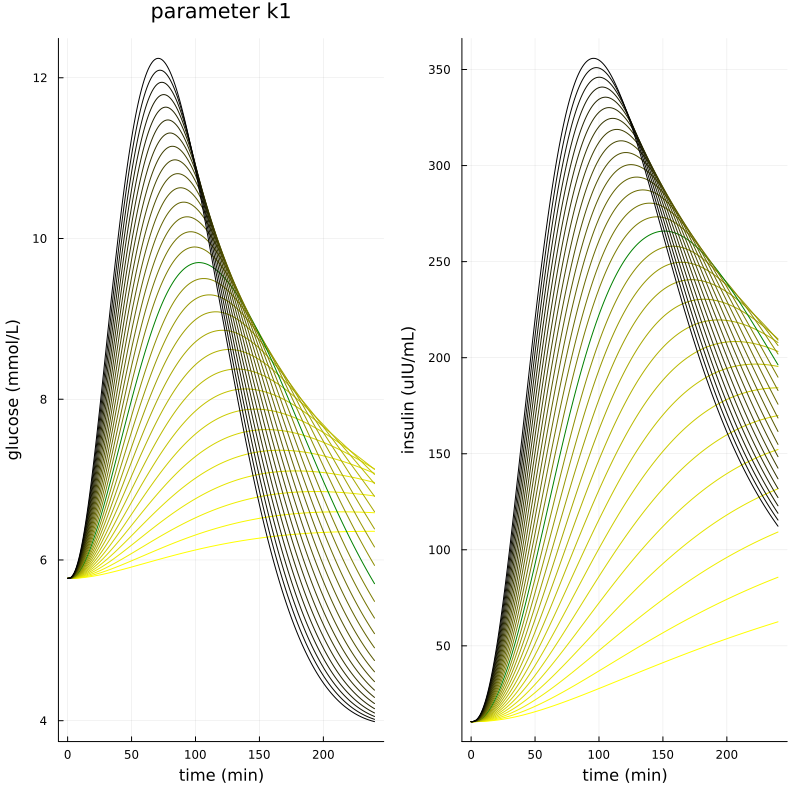

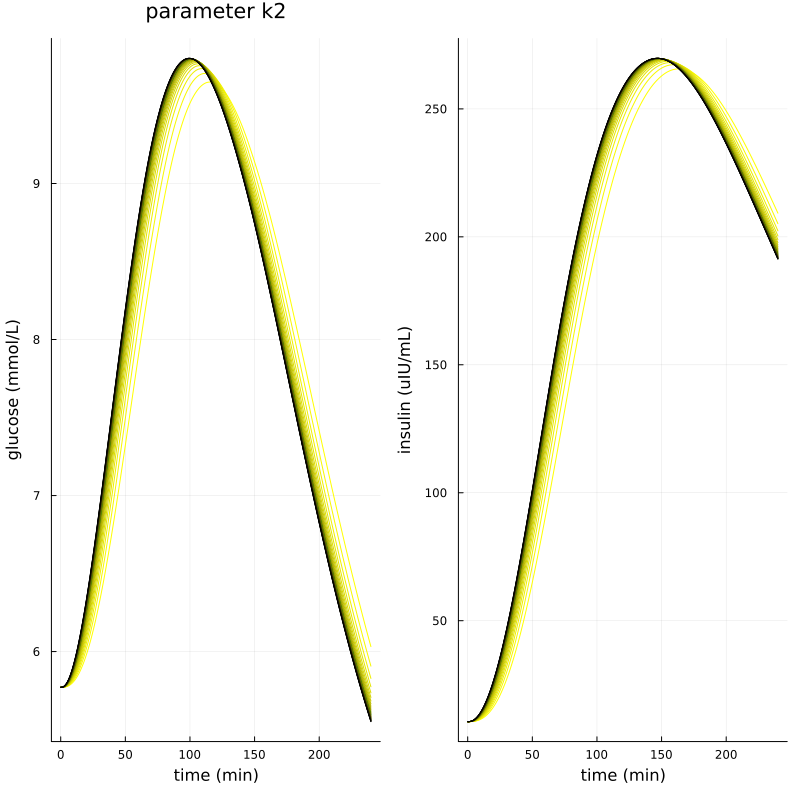

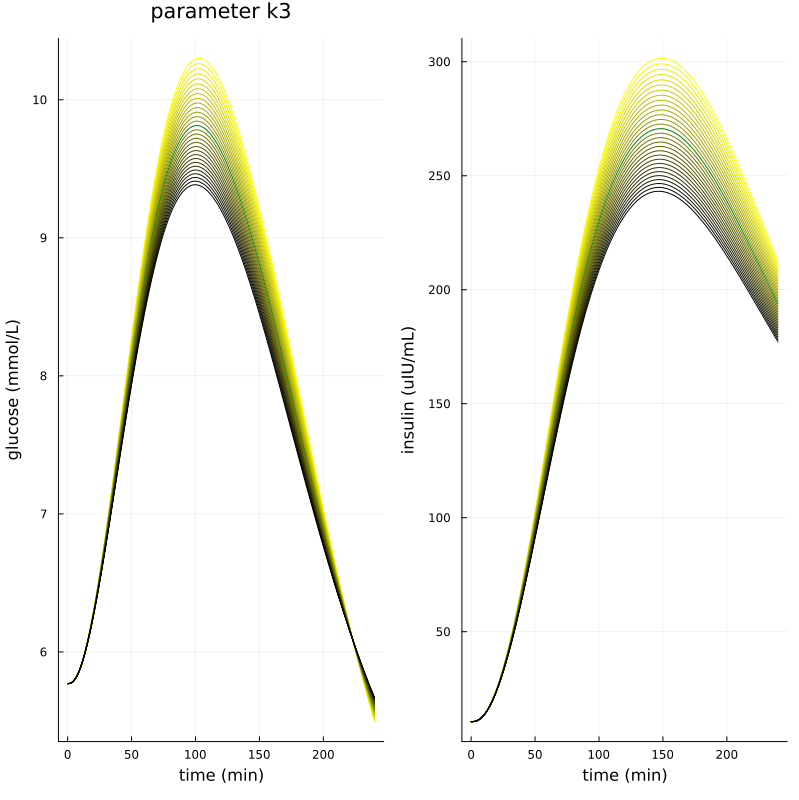

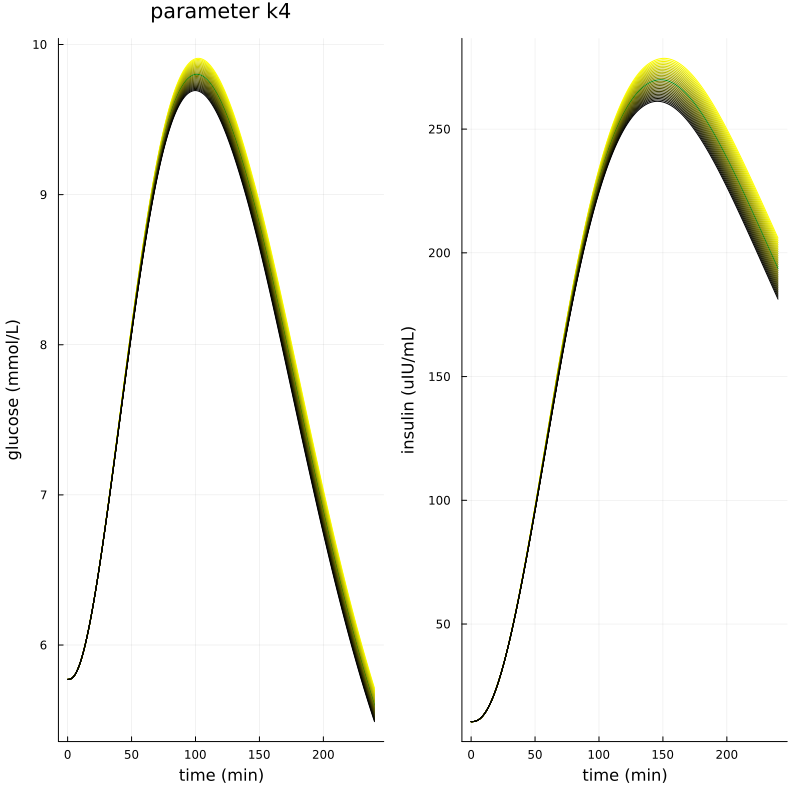

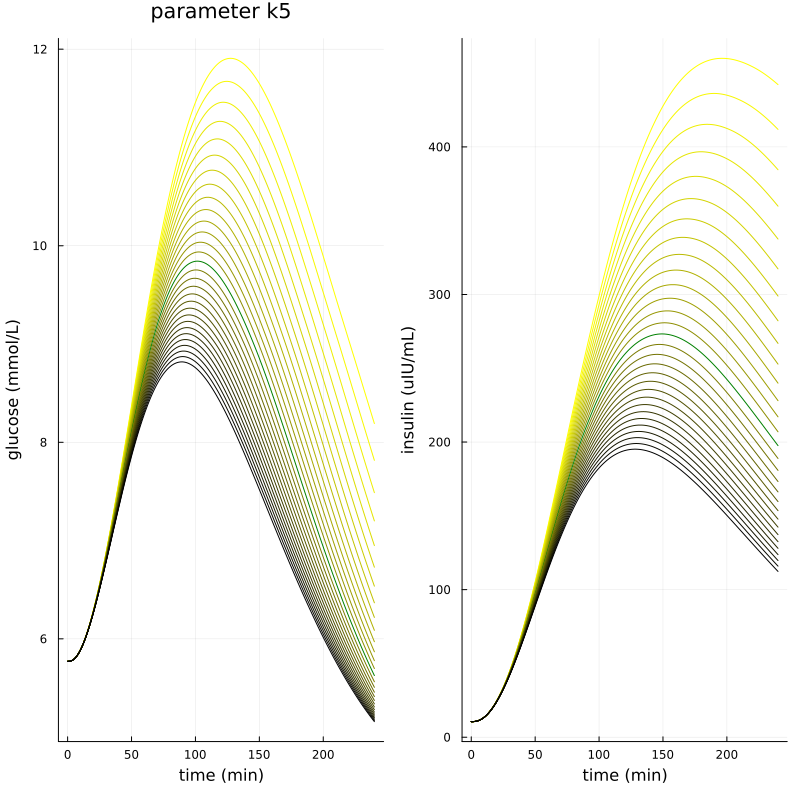

...

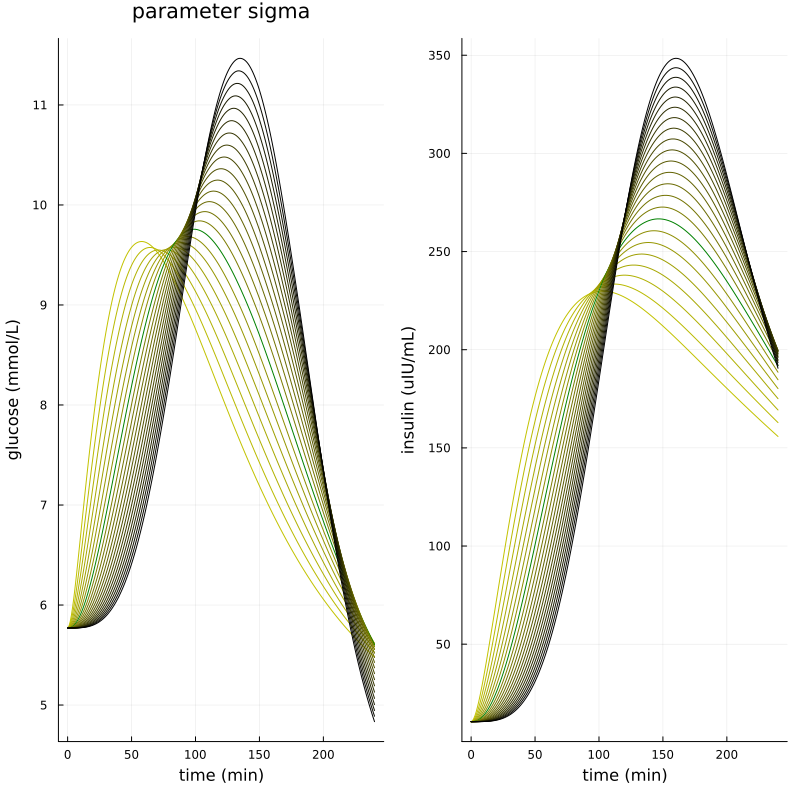

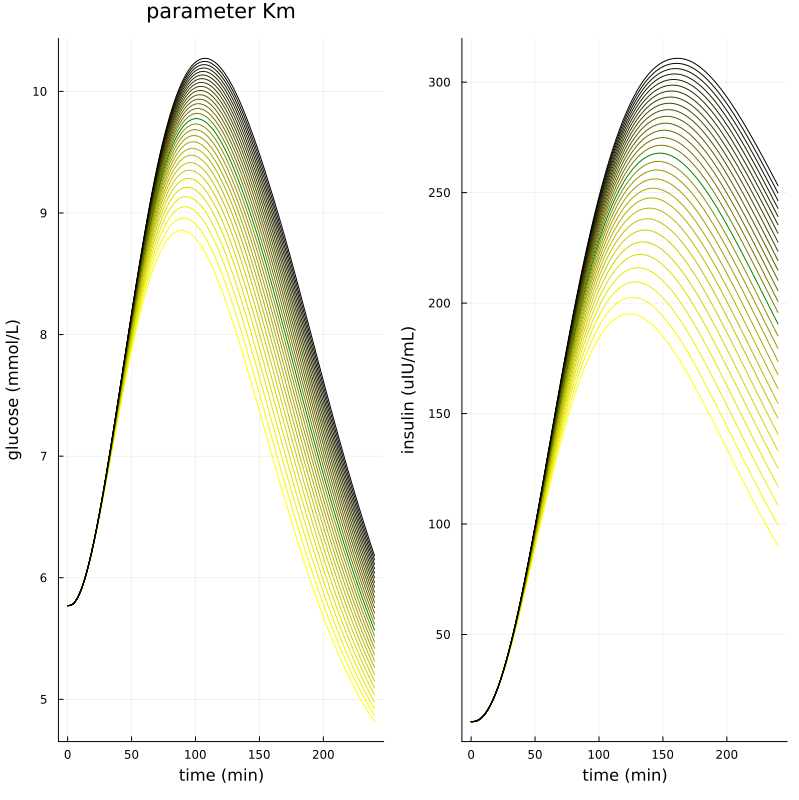

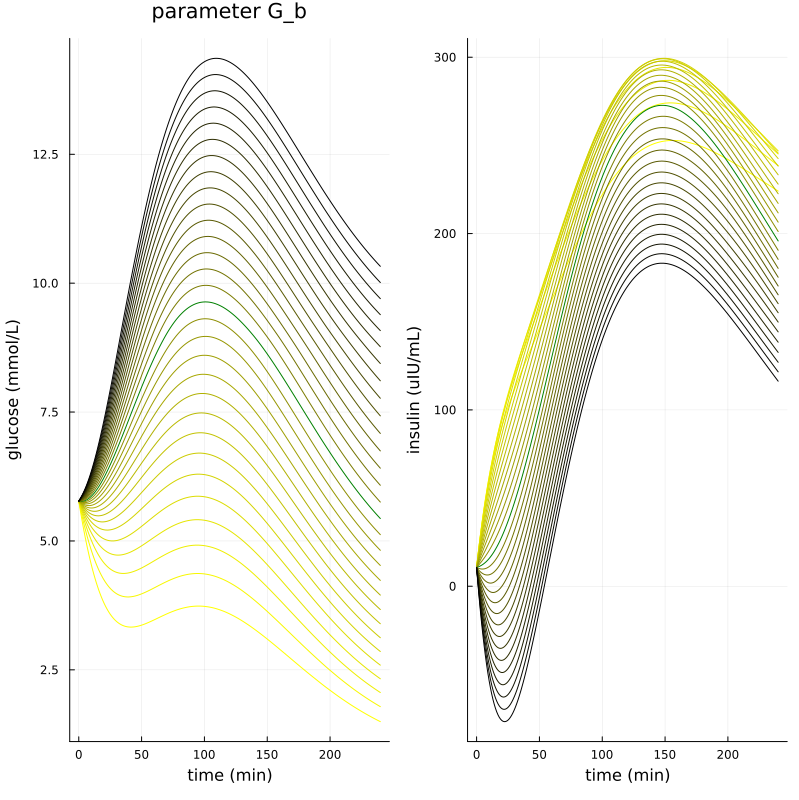

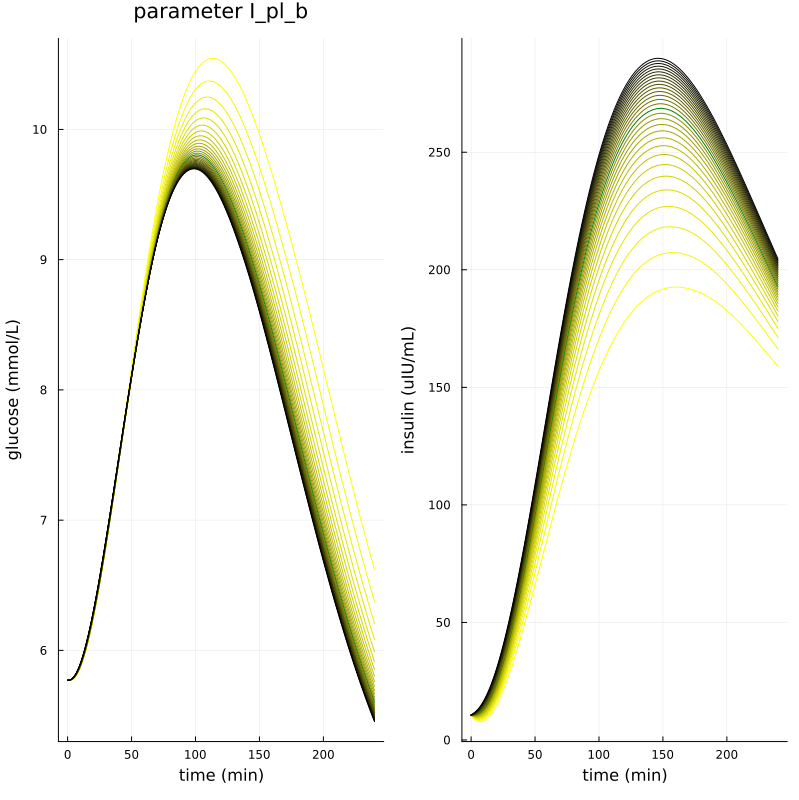

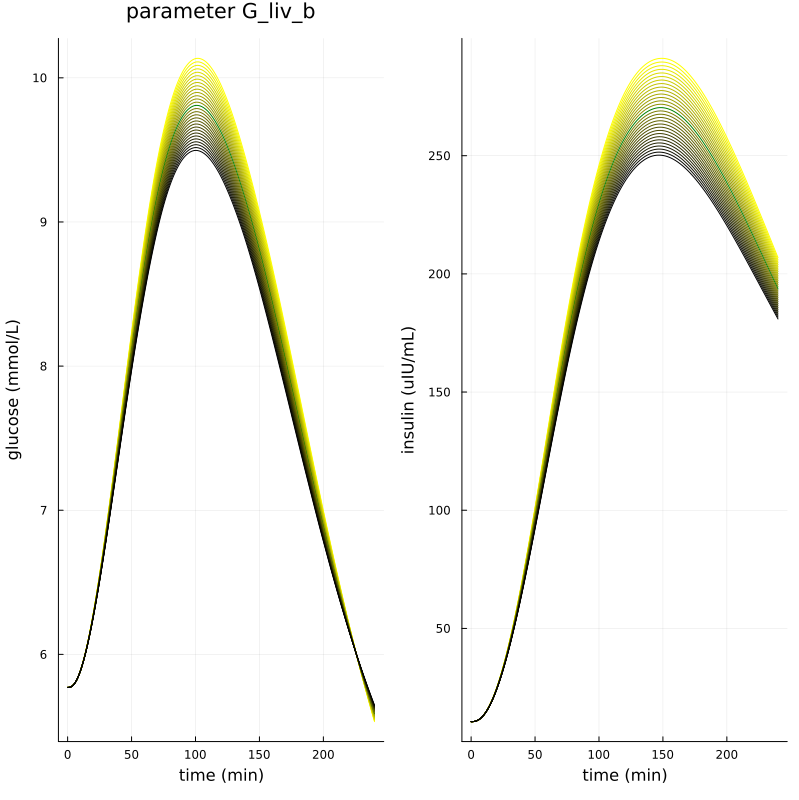

6×6 Matrix{Float64}:
 0.00759      0.00759      0.00759      0.00759      0.00759      0.00759
 0.00612123   0.00609565   0.00606124   0.00611113   0.0059376    0.00620646
 0.000234725  0.000235637  0.000235806  0.000241305  0.000234596  0.000237378
 0.113004     0.0632762    0.0336955    0.0196085    0.0104774    0.00681385
 2.13066      2.13066      2.13066      2.13066      2.13066      2.13066
 0.0429097    0.0427319    0.0420431    0.0425412    0.0433337    0.043278

In [133]:
include("../DataGeneration/AnalyseSynths/LocalSensitivity.jl") # for the local sensitivity analysis

param_names = ["k1", "k3", "k4", "k5", "k6", "G_liv_b"]
timepoint = 6
# select the first progression
progression =  training_progressions[1]
patient = progression.patient
param_values = progression.parameter_values[:,timepoint]

LocalSensitivityAnalysis(patient, param_values, param_names)
progression.parameter_values

### Sample timepoints from every OGTT